In [1]:
import cv2 as cv
import numpy as np
import pandas as pd
from scipy import ndimage
from matplotlib import pyplot as plt
from PIL import Image
import skimage as ski
from edt_utils import laplacian_filter

plt.rcParams['figure.figsize'] = [15, 15]

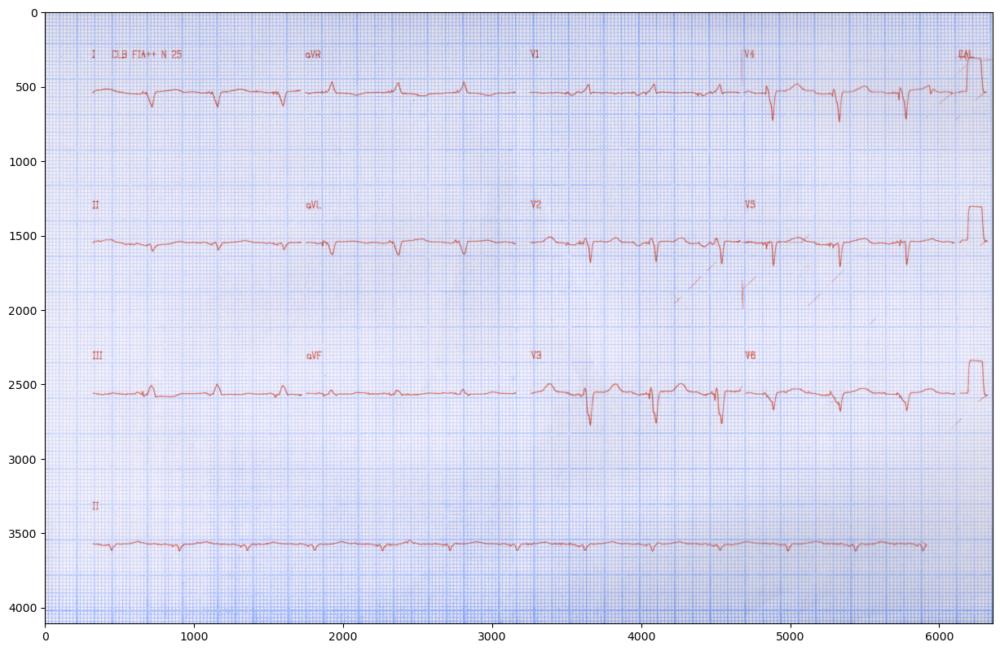

In [2]:
kSize2d=3
kSize1d=3
filename = 'bucket/img20250221_12515211'
image_name = filename + '.png'

original_image = cv.imread(image_name)
plt.imshow(original_image)
plt.show()



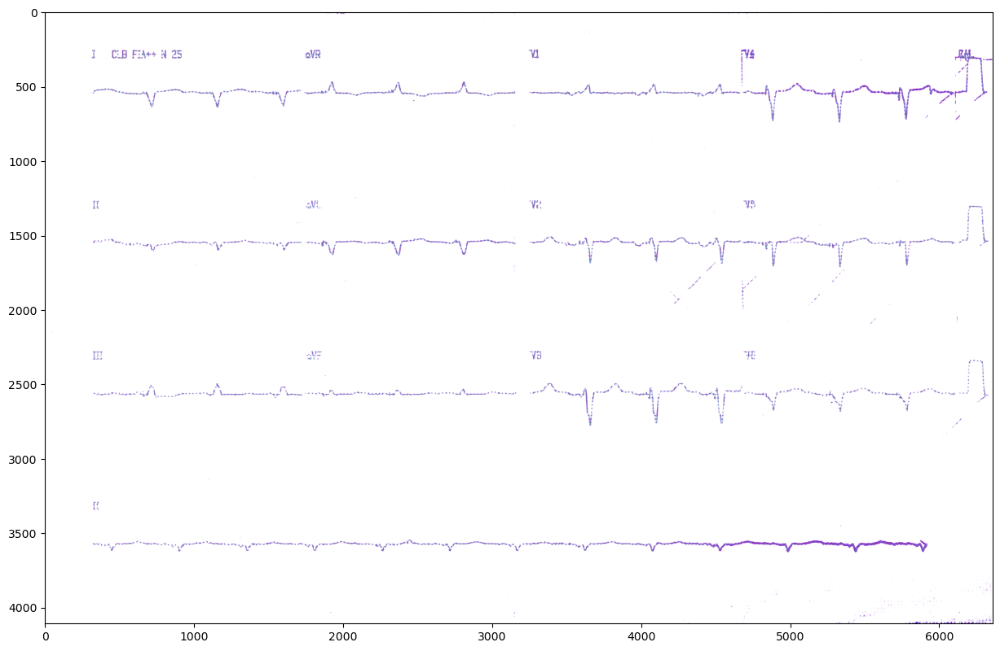

In [3]:
img_hsv=cv.cvtColor(original_image, cv.COLOR_BGR2HSV)

#Filter color to remove the grid
    
lower=(0,0,0) # black color
upper=(179,255,220) # dark gray
mask = cv.inRange(img_hsv, lower, upper)
result = img_hsv.copy()
result[mask!=255] = (255, 255, 255) # if it is not very dark set it to white
plt.imshow(result)
plt.show()


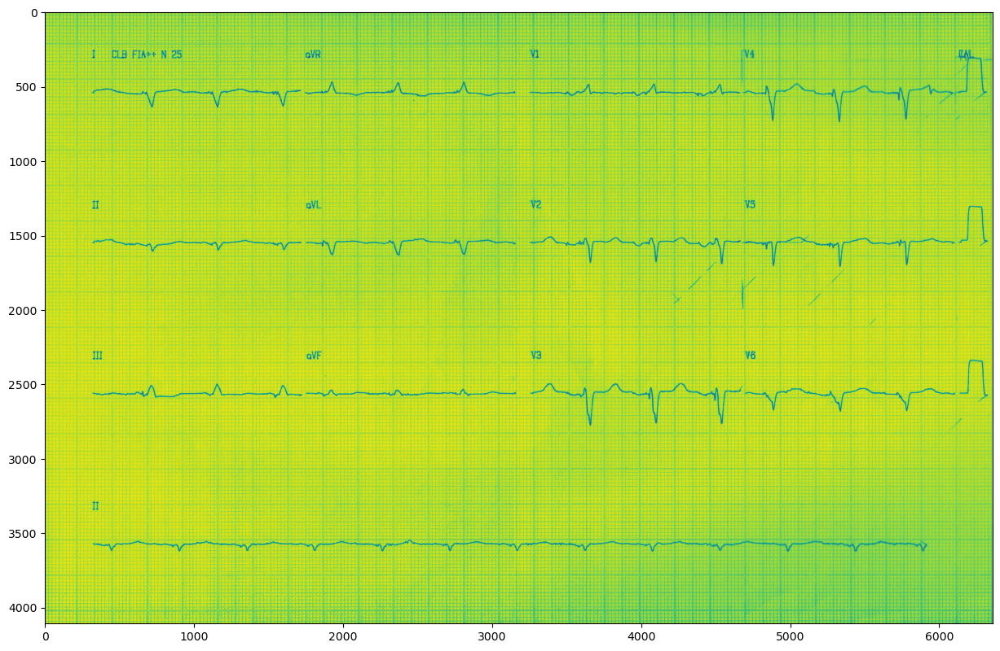

In [3]:
 #Convert to gray scale

gray_image = cv.cvtColor(original_image, cv.COLOR_BGR2GRAY)
plt.imshow(gray_image)
plt.show()


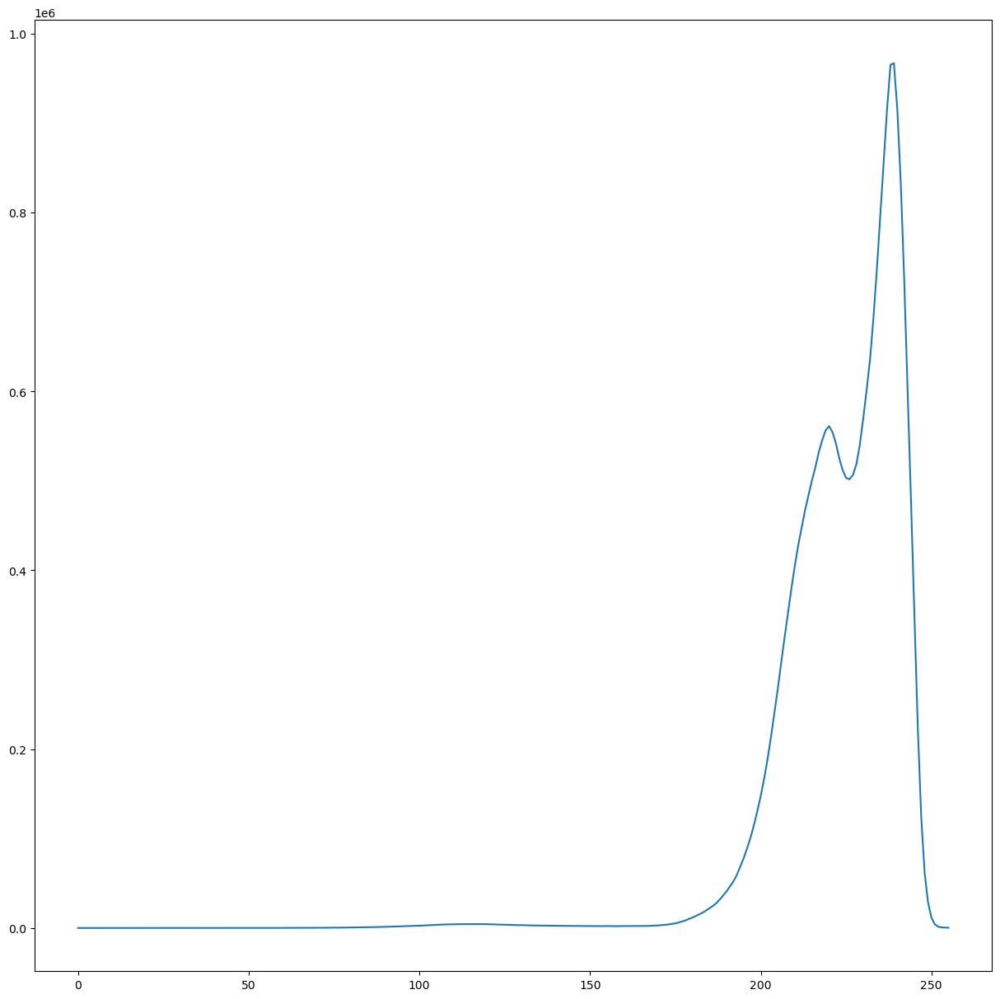

In [ ]:
histr = cv.calcHist([gray_image],[0],None,[256],[0,256])
fig, ax = plt.subplots()
ax.plot(histr)

ax.set_xticks([0, 2, 4, 6])  
ax.set_yticks([-1, 0, 1])   
plt.plot(histr)
plt.show()


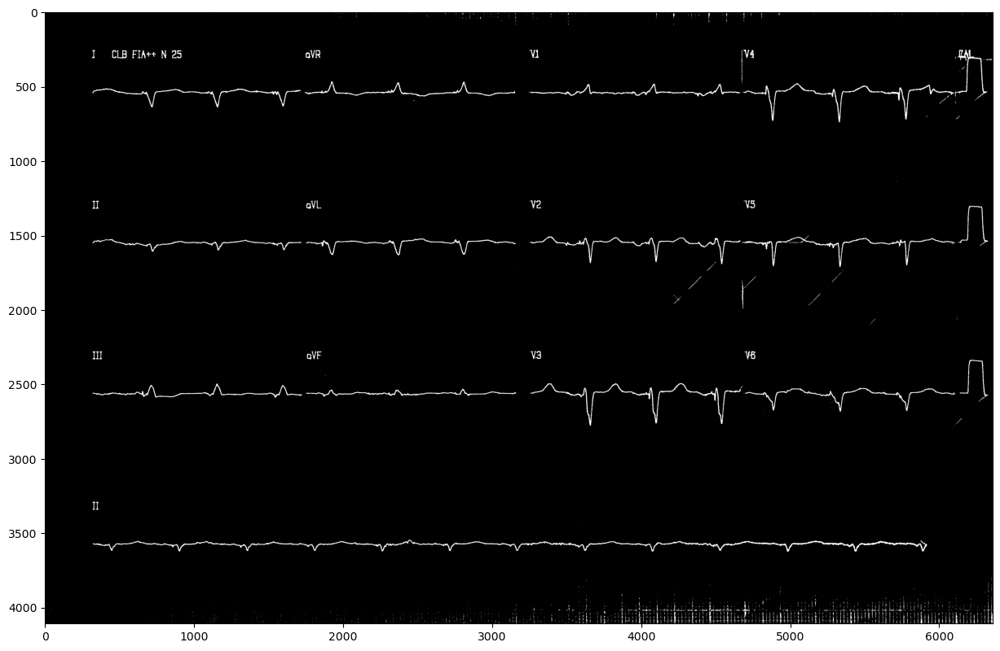

In [16]:
ret,thresh2 = cv.threshold(gray_image,180,255,cv.THRESH_BINARY_INV)
plt.imshow(thresh2, cmap="gray")
plt.show()

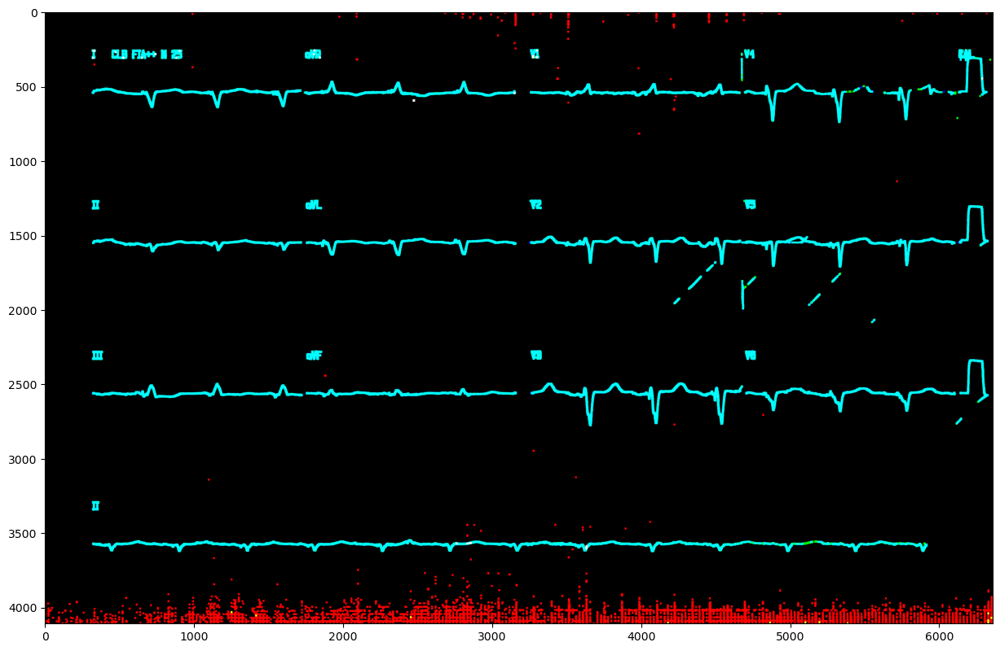

In [7]:
kernel = np.ones((5,5),np.uint8)
dilate = cv.morphologyEx(thresh2, cv.MORPH_DILATE, kernel,iterations = 3)
plt.imshow(dilate, cmap="gray")
plt.show()

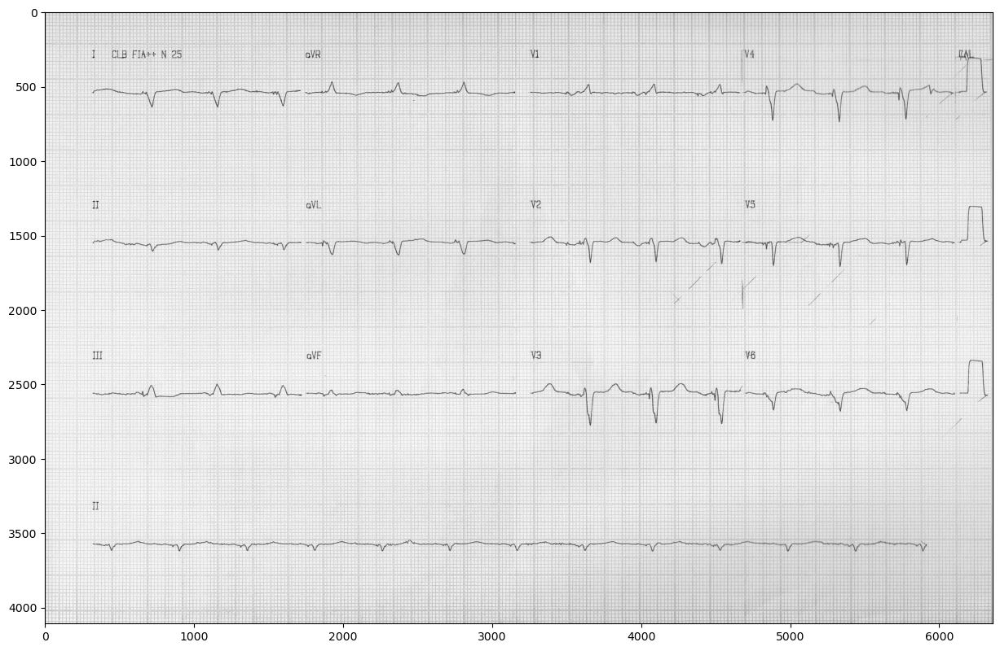

In [5]:
# Image sharpening.
lpl_image = laplacian_filter(gray_image, 3, 7, 0.5)
plt.imshow(lpl_image, cmap="gray")
plt.show()

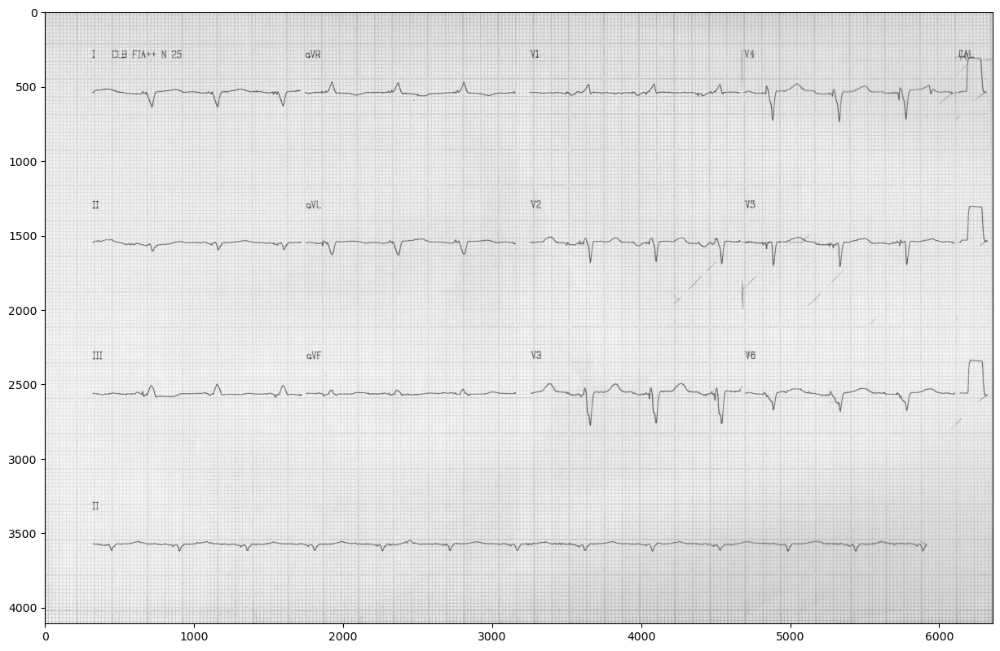

In [6]:
# 1D blur.
box1d_image = cv.filter2D(lpl_image, cv.CV_32F, np.ones((1, kSize1d), np.float32) / kSize1d)
plt.imshow(box1d_image, cmap="gray")
plt.show()

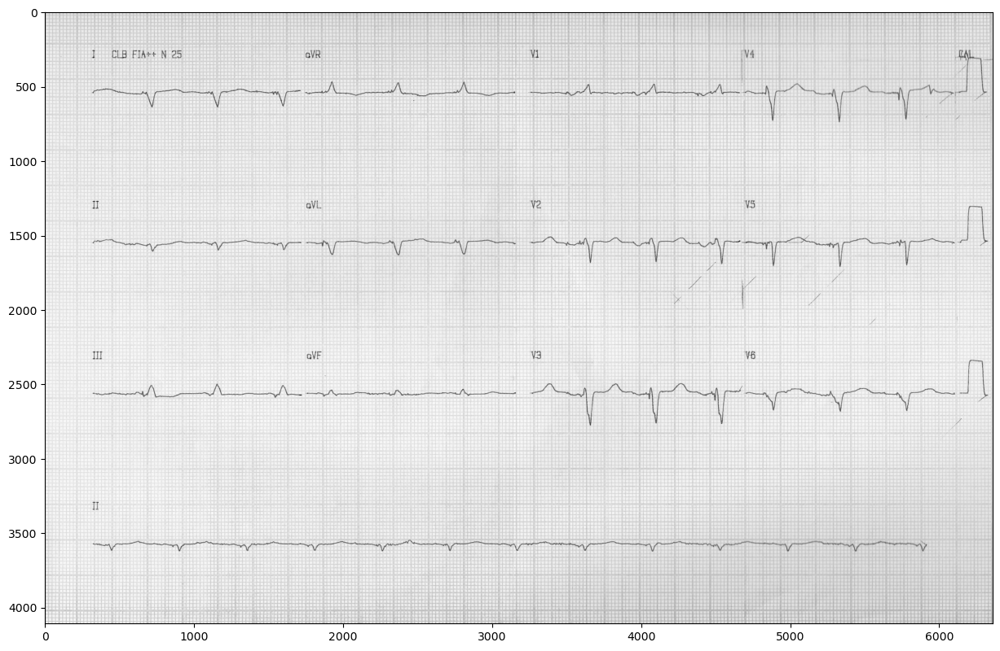

In [7]:
 # Box blur.
box2d_image = cv.filter2D(lpl_image, cv.CV_32F, np.ones((kSize2d, kSize2d), np.float32) / (kSize2d * kSize2d))
plt.imshow(box2d_image, cmap="gray")
plt.show()

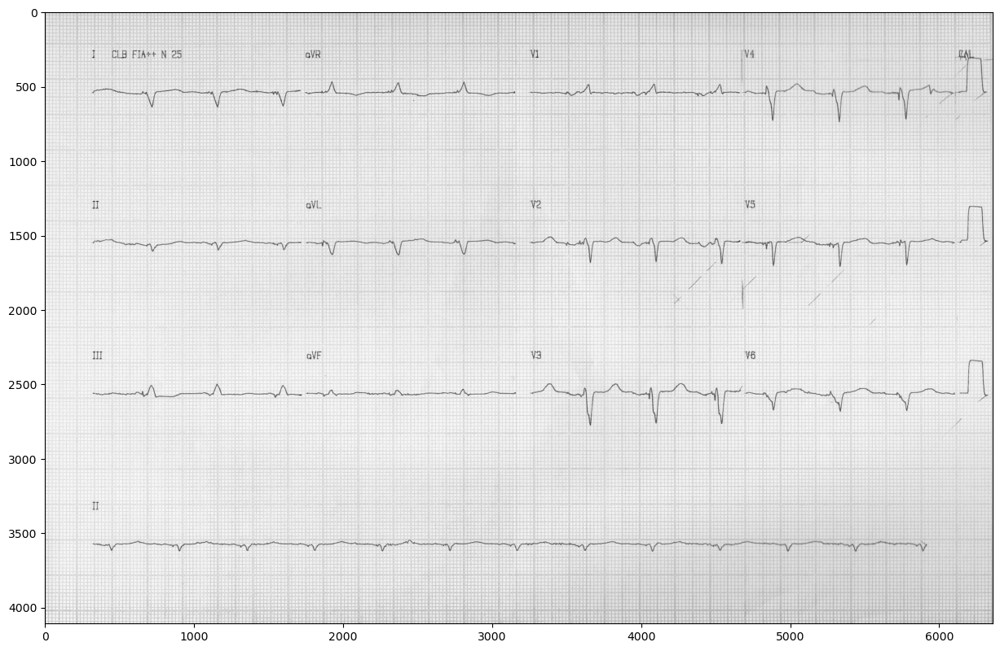

In [8]:
# All left/right neighbors.
h0 = np.array([[1.0, 0.0, 1.0],
                   [1.0, 1.0, 1.0],
                   [1.0, 0.0, 1.0]], np.float32) / 7.0
lr_neigh_img = cv.filter2D(lpl_image, cv.CV_32F, h0)

plt.imshow(lr_neigh_img, cmap="gray")
plt.show()

In [9]:
 # All combined neighbours.    
h1 = np.array([1.0, 1.0, 1.0], np.float32) / 3.0
z1 = cv.filter2D(lpl_image, cv.CV_32F, h1)

h2 = np.array([[1.0, 0.0, 0.0],
                   [0.0, 1.0, 0.0],
                   [0.0, 0.0, 1.0]], np.float32) / 3.0
z2 = cv.filter2D(lpl_image, cv.CV_32F, h2)

h3 = np.array([[0.0, 0.0, 1.0], 
                   [0.0, 1.0, 0.0],
                   [1.0, 0.0, 0.0]], np.float32) / 3.0
z3 = cv.filter2D(lpl_image, cv.CV_32F, h3)

all_neigh_img = np.maximum(np.maximum(z1, z2), z3)

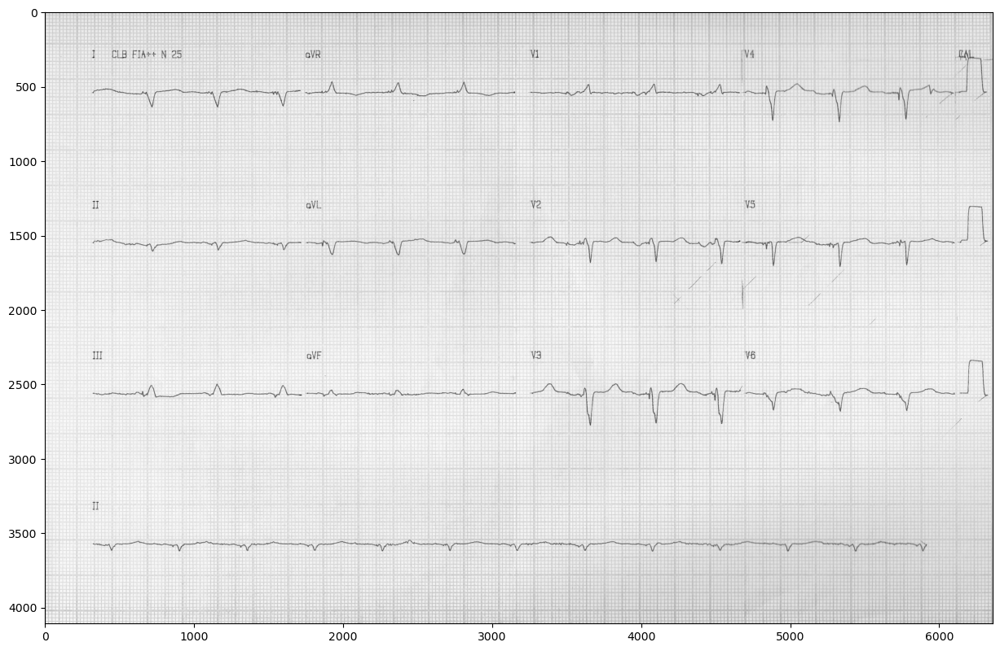

In [10]:
plt.imshow(all_neigh_img, cmap="gray")
plt.show()

In [11]:
lpl_image.shape, box1d_image.shape, box2d_image.shape, lr_neigh_img.shape, all_neigh_img.shape

((4108, 6358), (4108, 6358), (4108, 6358), (4108, 6358), (4108, 6358))

In [12]:
output_image = np.median([
                        lpl_image,
                        box1d_image,
                        box2d_image,
                        lr_neigh_img,
                        all_neigh_img
                            ], axis=0)


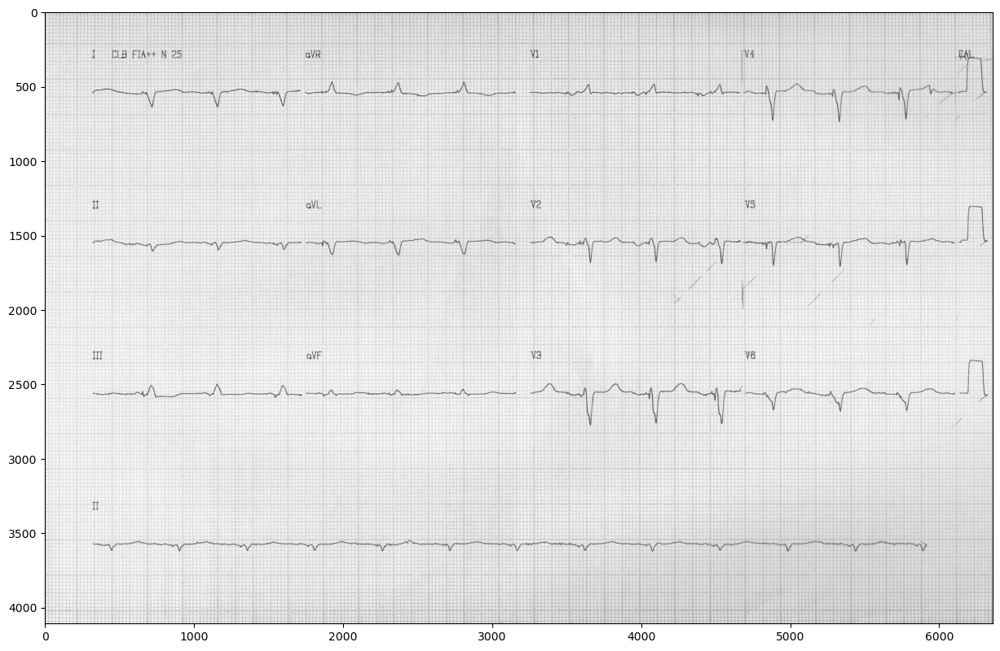

In [39]:
plt.imshow(output_image, cmap="gray")
plt.show()

In [13]:
# use thresholding to transform the image into a binary one

I = cv.normalize(output_image, None, 255, 0, cv.NORM_MINMAX, cv.CV_8U)


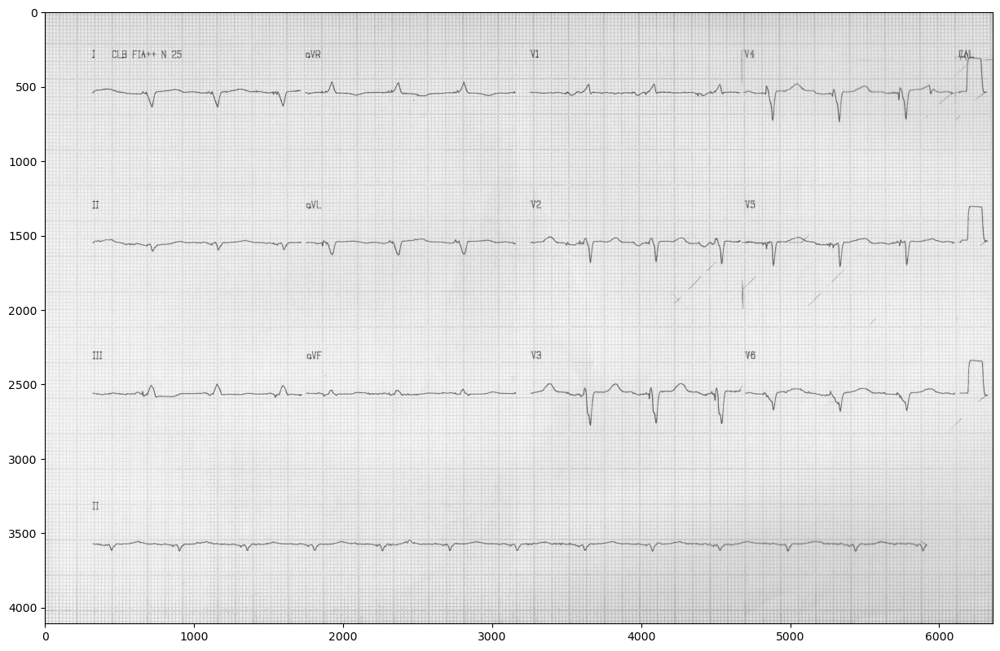

In [14]:
plt.imshow(I, cmap="gray")

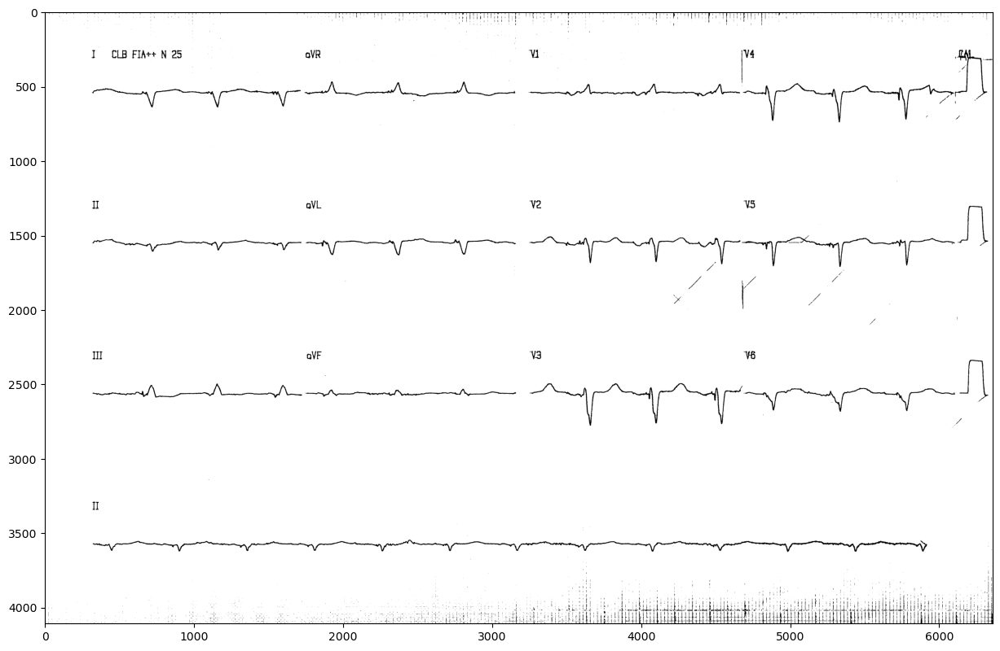

In [15]:
ret, th1 = cv.threshold(I, 180, 255,cv.THRESH_BINARY)
plt.imshow(th1, cmap="gray")
plt.show()

### Convert it image to gray and aplly threshold
 

In [19]:
def get_bin_img (input_img):
    I = cv.normalize(input_img, None, 255, 0, cv.NORM_MINMAX, cv.CV_8U)
    ret, th1 = cv.threshold(I, 180, 255,cv.THRESH_BINARY)
    plt.imshow(th1, cmap="gray")
    plt.show()
    return th1

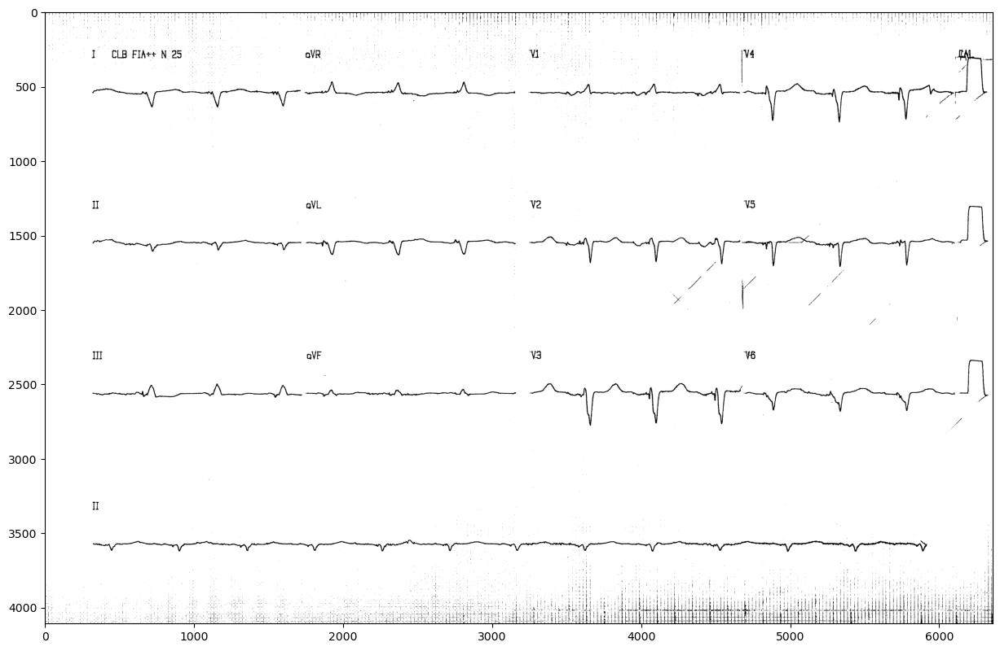

In [20]:
# box1d_image,
# box2d_image,
# lr_neigh_img,
# all_neigh_img
lpl_bin = get_bin_img(lpl_image)


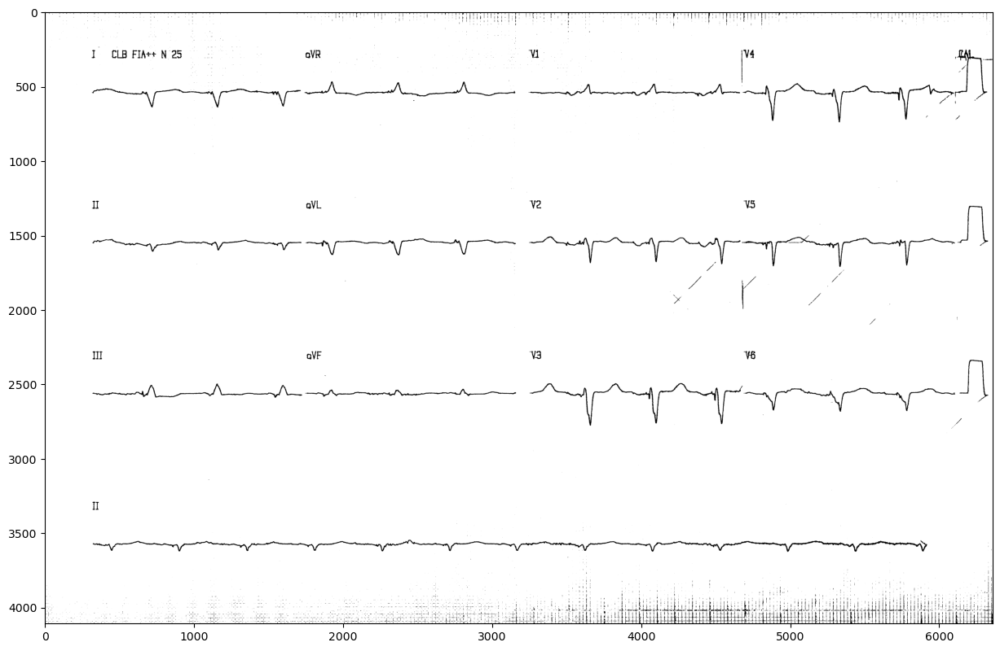

In [21]:
box1d_bin = get_bin_img(box1d_image)


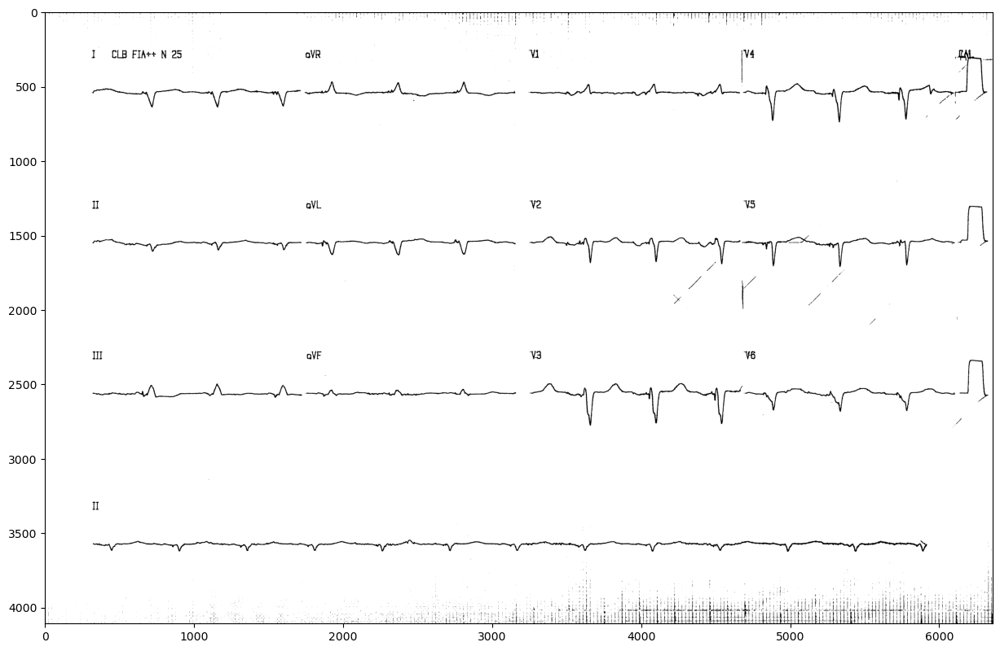

In [22]:
box2d_bin = get_bin_img(box2d_image)


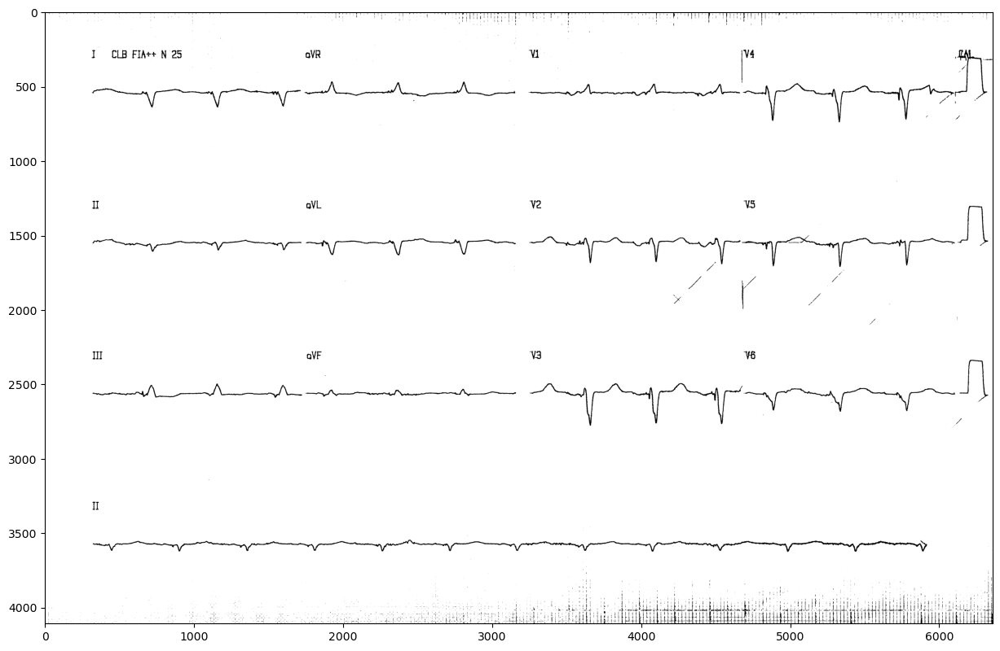

In [23]:
lr_neigh_bin = get_bin_img(lr_neigh_img)


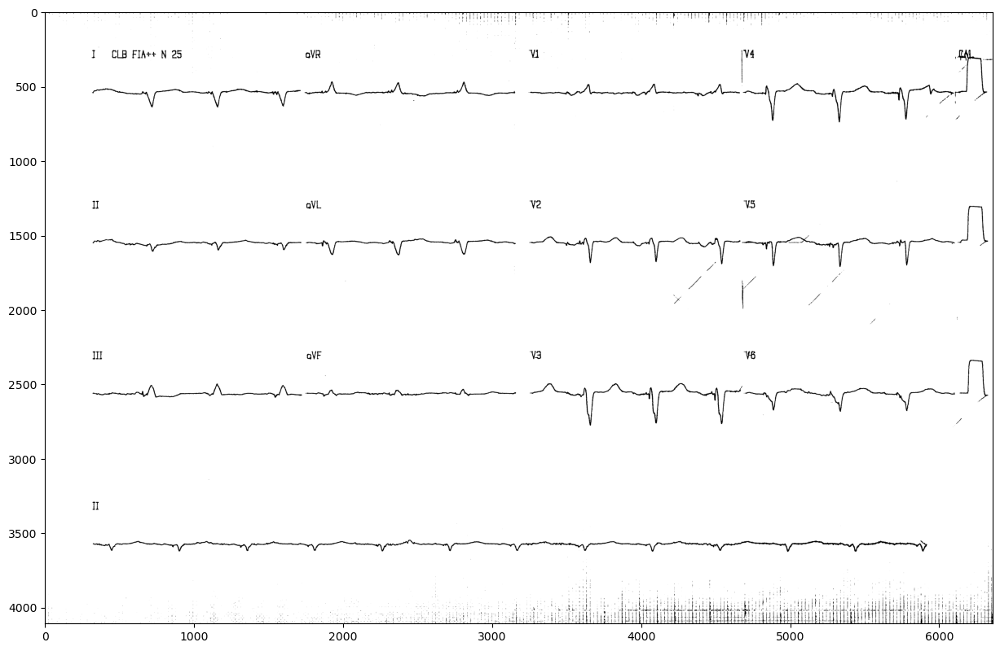

In [24]:
all_neigh_bin = get_bin_img(all_neigh_img)

bitwise_OR = cv.bitwise_or(lpl_bin, box1d_bin)
bitwise_OR = cv.bitwise_or(bitwise_OR, box2d_bin)
bitwise_OR = cv.bitwise_or(bitwise_OR, lr_neigh_bin)
plt.imshow(bitwise_OR, cmap="gray")
plt.show()
